In [59]:
import numpy as np
import matplotlib.pyplot as plt
import trimesh

In [60]:
import Iterative_PCA_Model
import GCN_Model
import Data_loader
import Gaussian_inference
import PPCA_Model

In [61]:
show_mesh = False

In [62]:
random_state=42
np.random.seed(random_state)

In [63]:
mesh_data=Data_loader.MeshDataset()
mesh_data.load_data()

In [64]:
#Masking  des sommets des modèles
def build_mask(mat_vertices, missing_rate=0.3, random=True, pca_mode=True):
    N, M, _ = mat_vertices.shape
    mask = np.zeros((N, M), dtype=bool)
    
    if random or pca_mode:
        mask = np.random.random((N, M)) < missing_rate
        if pca_mode:
            # Ensure at least one observed value per column
            observed_per_col = (~mask).sum(axis=0)
            missing_cols = np.where(observed_per_col == 0)[0]
            mask[np.random.randint(N, size=len(missing_cols)), missing_cols] = False

    else:
        n_missing = int(M * missing_rate)
        mask[:, :n_missing] = True
    
    print(f"Number of missing values: {mask.sum()} out of {N*M} ({100 * mask.sum() / (N*M):.2f}%)")
    return mask

In [65]:
def one_augmentation(mat_vertices):
    N, M, D = mat_vertices.shape
    mat_vertices_augmented = np.zeros((N, M,  D + 1))
    mat_vertices_augmented[:, :M, :D] = mat_vertices
    mat_vertices_augmented[:, M:, 0] = 1.0  # Augmentation channel
    return mat_vertices_augmented

In [66]:
def remove_one_augmentation(mat_vertices_augmented):
    N, M_augmented, D_augmented = mat_vertices_augmented.shape
    D = D_augmented - 1
    mat_vertices = mat_vertices_augmented[:, :M_augmented, :D]
    return mat_vertices

# I. Data loading

In [67]:
X_train=mesh_data.get_all_vertices(mesh_data.dataset_train)
X_val=mesh_data.get_all_vertices(mesh_data.dataset_val)
X_test=mesh_data.get_all_vertices(mesh_data.dataset_test)

In [68]:
#Affichage d'un modèle du train
ex_mesh = mesh_data.reconstruct_mesh_from_dataset(mesh_data.dataset_train, index=0)

if show_mesh:
    ex_mesh.show()

In [69]:
models_test_errors = {}
worst_reconstructed_meshes = {}
ind_worst_reconstructed_meshes = {}
colored_errors_worst_reconstructed_meshes = {}

# II. PCA STUDY

## II.1 Exact PCA

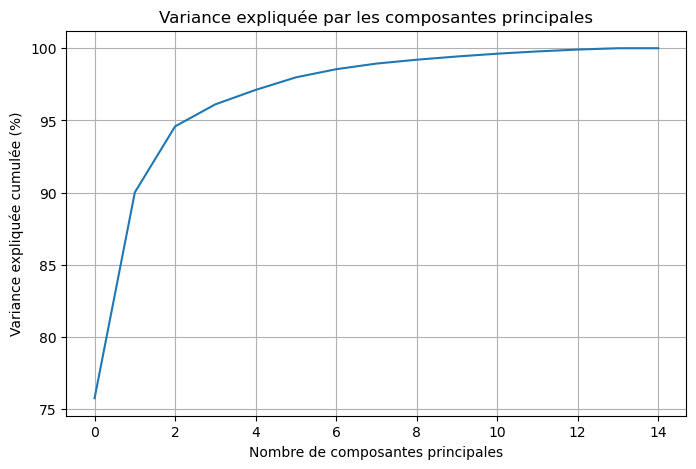

In [70]:
X_train_flat = mesh_data.flatten_vertices(X_train)
X_val_flat = mesh_data.flatten_vertices(X_val)
X_test_flat = mesh_data.flatten_vertices(X_test)

pca_model = Iterative_PCA_Model.Iterative_PCA(n_components=X_train_flat.shape[0], random_state=random_state)
pca_model.fit_filled(X_train_flat)
pca_model.plot_explained_variance()

In [71]:
n_components = 7

pca_model = Iterative_PCA_Model.Iterative_PCA(n_components=n_components, random_state=random_state)
pca_model.fit_filled(X_train_flat)

X_test_flat_reconstructed = pca_model.inverse_transform(pca_model.transform(X_test_flat))
X_test_reconstructed = mesh_data.reconstruct_vertices_from_flat_vertices(X_test_flat_reconstructed)

error = pca_model.compute_error(X_test_reconstructed, X_test)
print(f"Reconstruction error on test set: {error}")

errors = []
for i in range(len(X_test_reconstructed)):
    errors.append(pca_model.compute_error(X_test_reconstructed[i:i+1], X_test[i:i+1]))
    print(f"Reconstruction error on test model {i}: {errors[-1]}")

print(f"Average reconstruction error on test set: {np.mean(errors)}")
print(f"Standard deviation of reconstruction error on test set: {np.std(errors)}")

worst_flat_index = np.argmax(errors)
print(f"Worst reconstructed model index: {worst_flat_index}")

Reconstruction error on test set: 0.011652189306914806
Reconstruction error on test model 0: 0.02301240712404251
Reconstruction error on test model 1: 0.025400182232260704
Reconstruction error on test model 2: 0.03391459956765175
Reconstruction error on test model 3: 0.02120571956038475
Reconstruction error on test model 4: 0.02489408105611801
Average reconstruction error on test set: 0.025685399770736694
Standard deviation of reconstruction error on test set: 0.004373549949377775
Worst reconstructed model index: 2


In [72]:
worst_vertices= X_test[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices)

if show_mesh:
    worst_reconstructed_mesh.show()

In [73]:
worst_vertices_reconstructed = X_test_reconstructed[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices_reconstructed)

if show_mesh:
    worst_reconstructed_mesh.show()

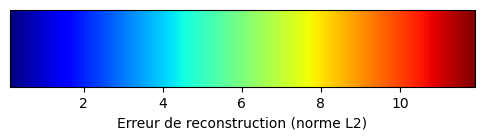

In [74]:
# Calcul des erreurs
errors = np.linalg.norm(worst_vertices_reconstructed - worst_vertices, axis=1)
errors_norm = (errors - errors.min()) / (errors.max() - errors.min())

# Colormap
cmap = plt.get_cmap("jet")
colors = (cmap(errors_norm)[:, :3] * 255).astype(np.uint8)

# Mesh coloré
mesh_error = trimesh.Trimesh(
    vertices=worst_vertices_reconstructed,
    faces=mesh_data.faces,
    vertex_colors=colors
)


fig, ax = plt.subplots(figsize=(6, 1))
norm = plt.Normalize(vmin=errors.min(), vmax=errors.max())
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cb = plt.colorbar(sm, cax=ax, orientation='horizontal')
cb.set_label('Erreur de reconstruction (norme L2)')
plt.show()

# --- Afficher le mesh ---
mesh_error.show()

In [75]:
#Sotckage résultats modèle

models_test_errors['Exact PCA'] = pca_model.compute_error(X_test_reconstructed, X_test)
worst_reconstructed_meshes ['Exact PCA'] = worst_reconstructed_mesh
ind_worst_reconstructed_meshes['Exact PCA'] = worst_flat_index
colored_errors_worst_reconstructed_meshes['Exact PCA'] = mesh_error

## II.2 Exact PCA with 1-augmentation

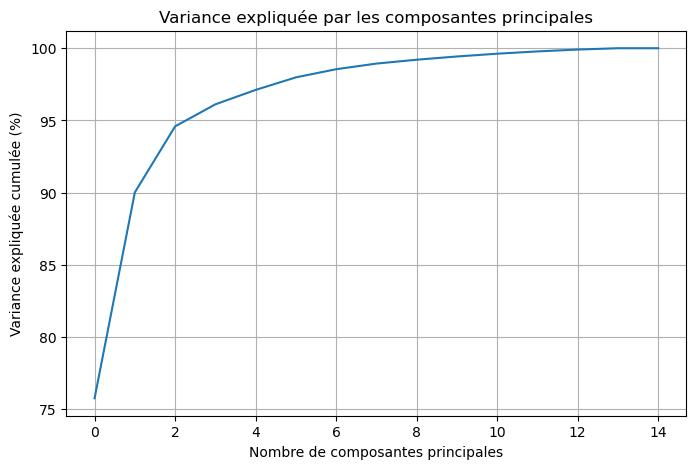

Reconstruction error on test set: 0.011652190116978794
Reconstruction error on test model 0: 0.023012409829157924
Reconstruction error on test model 1: 0.025400184057175864
Reconstruction error on test model 2: 0.03391460351397104
Reconstruction error on test model 3: 0.02120571844073879
Reconstruction error on test model 4: 0.024894079229290166
Average reconstruction error on test set: 0.025685399014066756
Standard deviation of reconstruction error on test set: 0.004373551200028407
Worst reconstructed model index: 2


In [76]:
X_train_augmented = one_augmentation(X_train)
X_val_augmented = one_augmentation(X_val)
X_test_augmented = one_augmentation(X_test)

X_train_augmented_flat = mesh_data.flatten_vertices(X_train_augmented)
X_val_augmented_flat = mesh_data.flatten_vertices(X_val_augmented)
X_test_augmented_flat = mesh_data.flatten_vertices(X_test_augmented)

pca_model = Iterative_PCA_Model.Iterative_PCA(n_components=X_train_augmented_flat.shape[0], random_state=random_state)
pca_model.fit_filled(X_train_augmented_flat)
pca_model.plot_explained_variance()

pca_model = Iterative_PCA_Model.Iterative_PCA(n_components=n_components, random_state=random_state)
pca_model.fit_filled(X_train_augmented_flat)

X_test_flat_augmented_reconstructed = pca_model.inverse_transform(pca_model.transform(X_test_augmented_flat))
X_test_augmented_reconstructed = mesh_data.reconstruct_vertices_from_flat_vertices(X_test_flat_augmented_reconstructed, augmented_dim=1)
X_test_reconstructed = remove_one_augmentation(X_test_augmented_reconstructed)

error = pca_model.compute_error(X_test_reconstructed, X_test)
print(f"Reconstruction error on test set: {error}")

errors = []
for i in range(len(X_test_reconstructed)):
    errors.append(pca_model.compute_error(X_test_reconstructed[i:i+1], X_test[i:i+1]))
    print(f"Reconstruction error on test model {i}: {errors[-1]}")

print(f"Average reconstruction error on test set: {np.mean(errors)}")
print(f"Standard deviation of reconstruction error on test set: {np.std(errors)}")

worst_flat_index = np.argmax(errors)
print(f"Worst reconstructed model index: {worst_flat_index}")

In [77]:
worst_vertices= X_test[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices)

if show_mesh:
    worst_reconstructed_mesh.show()

In [78]:
worst_vertices_reconstructed = X_test_reconstructed[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices_reconstructed)

if show_mesh:
    worst_reconstructed_mesh.show()

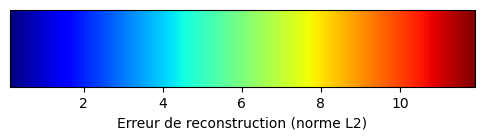

In [79]:
# Calcul des erreurs
errors = np.linalg.norm(worst_vertices_reconstructed - worst_vertices, axis=1)
errors_norm = (errors - errors.min()) / (errors.max() - errors.min())

# Colormap
cmap = plt.get_cmap("jet")
colors = (cmap(errors_norm)[:, :3] * 255).astype(np.uint8)

# Mesh coloré
mesh_error = trimesh.Trimesh(
    vertices=worst_vertices_reconstructed,
    faces=mesh_data.faces,
    vertex_colors=colors
)


fig, ax = plt.subplots(figsize=(6, 1))
norm = plt.Normalize(vmin=errors.min(), vmax=errors.max())
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cb = plt.colorbar(sm, cax=ax, orientation='horizontal')
cb.set_label('Erreur de reconstruction (norme L2)')
plt.show()

# --- Afficher le mesh ---
mesh_error.show()

In [80]:
#Sotckage résultats modèle

models_test_errors['PCA_1_aug'] = pca_model.compute_error(X_test_reconstructed, X_test)
worst_reconstructed_meshes ['PCA_1_aug'] = worst_reconstructed_mesh
ind_worst_reconstructed_meshes['PCA_1_aug'] = worst_flat_index
colored_errors_worst_reconstructed_meshes['PCA_1_aug'] = mesh_error

## II.3 PCA with missing values

In [81]:
mask_train = build_mask(X_train, missing_rate=0.2, random=True, pca_mode=True)
mask_val = build_mask(X_val, missing_rate=0.2, random=False, pca_mode=False)
mask_test = build_mask(X_test, missing_rate=0.6, random=False, pca_mode=False)

X_train_masked = X_train.copy()
X_train_masked[mask_train] = np.nan

X_val_masked = X_val.copy()
X_val_masked[mask_val] = np.nan

X_test_masked = X_test.copy()
X_test_masked[mask_test] = np.nan

Number of missing values: 54713 out of 274365 (19.94%)
Number of missing values: 14632 out of 73164 (20.00%)
Number of missing values: 54870 out of 91455 (60.00%)


In [82]:
random_flat_index = np.random.randint(0, X_test.shape[0])

random_mesh = mesh_data.reconstruct_mesh_from_vertices(X_test[random_flat_index])

mask_random_mesh = mask_test[random_flat_index]

# Conserver les faces dont les 3 vertices sont valides
masked_faces = random_mesh.faces[np.all(mask_random_mesh[random_mesh.faces] == False, axis=1)]

total_faces = random_mesh.faces.shape[0]
print(f'Nombre total de faces : {total_faces}')
print(f'Nombre de faces valides après masquage : {masked_faces.shape[0]}')
print(f'Pourcentage de faces valides après masquage : {masked_faces.shape[0]/total_faces*100:.2f}%')

masked_mesh = trimesh.Trimesh(
    vertices=random_mesh.vertices,   
    faces=masked_faces
)

masked_mesh.show()

Nombre total de faces : 36578
Nombre de faces valides après masquage : 14580
Pourcentage de faces valides après masquage : 39.86%


Early stopping at iteration: 178
Best iteration: 78


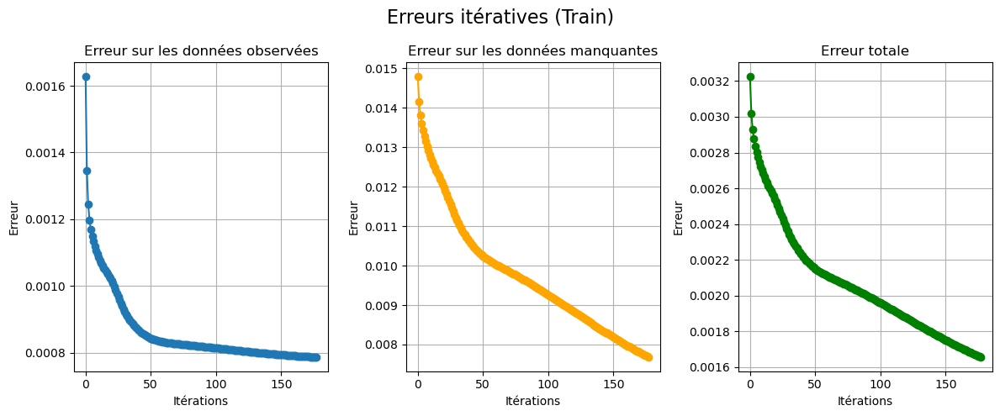

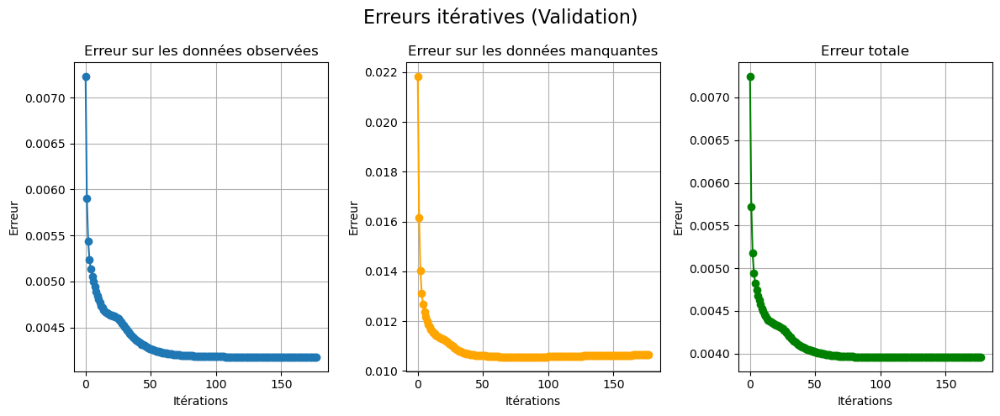

In [83]:
X_train_flat = mesh_data.flatten_vertices(X_train)
X_val_flat = mesh_data.flatten_vertices(X_val)
X_test_flat = mesh_data.flatten_vertices(X_test)

X_train_masked_flat = mesh_data.flatten_vertices(X_train_masked)
X_val_masked_flat = mesh_data.flatten_vertices(X_val_masked)
X_test_masked_flat = mesh_data.flatten_vertices(X_test_masked)

X_train_flat_reconstructed, X_val_flat_reconstructed, train_errors =pca_model.fit_iterative_known(
                                                                                                        X_train_masked_flat,
                                                                                                        X_train_flat,
                                                                                                        X_val_masked_flat,
                                                                                                        X_val_flat, 
                                                                                                        max_iter=200,
                                                                                                        Early_Stopping=True,
                                                                                                        patience=100,
                                                                                                    )
#Affichage des erreurs
pca_model.plot_train_errors(train_errors)


In [84]:
X_test_flat_reconstructed = pca_model.inference(X_test_masked_flat)
X_test_reconstructed = mesh_data.reconstruct_vertices_from_flat_vertices(X_test_flat_reconstructed)

error = pca_model.compute_error(X_test_reconstructed, X_test)
print(f"Reconstruction error on test set: {error}")

errors = []
for i in range(len(X_test_reconstructed)):
    errors.append(pca_model.compute_error(X_test_reconstructed[i:i+1], X_test[i:i+1]))
    print(f"Reconstruction error on test model {i}: {errors[-1]}")

print(f"Average reconstruction error on test set: {np.mean(errors)}")
print(f"Standard deviation of reconstruction error on test set: {np.std(errors)}")

worst_flat_index = np.argmax(errors)
print(f"Worst reconstructed model index: {worst_flat_index}")

Reconstruction error on test set: 0.027945883572101593
Reconstruction error on test model 0: 0.06666283309459686
Reconstruction error on test model 1: 0.0666356310248375
Reconstruction error on test model 2: 0.08938995003700256
Reconstruction error on test model 3: 0.03920193389058113
Reconstruction error on test model 4: 0.03335736319422722
Average reconstruction error on test set: 0.059049539268016815
Standard deviation of reconstruction error on test set: 0.02044537477195263
Worst reconstructed model index: 2


In [85]:
worst_vertices= X_test[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices)

if show_mesh:
    worst_reconstructed_mesh.show()

In [86]:
worst_vertices_reconstructed = X_test_reconstructed[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices_reconstructed)

if show_mesh:
    worst_reconstructed_mesh.show()

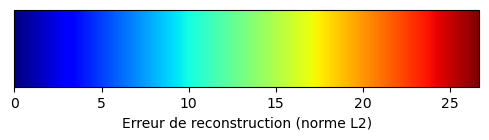

In [87]:
# Calcul des erreurs
errors = np.linalg.norm(worst_vertices_reconstructed - worst_vertices, axis=1)
errors_norm = (errors - errors.min()) / (errors.max() - errors.min())

# Colormap
cmap = plt.get_cmap("jet")
colors = (cmap(errors_norm)[:, :3] * 255).astype(np.uint8)

# Mesh coloré
mesh_error = trimesh.Trimesh(
    vertices=worst_vertices_reconstructed,
    faces=mesh_data.faces,
    vertex_colors=colors
)


fig, ax = plt.subplots(figsize=(6, 1))
norm = plt.Normalize(vmin=errors.min(), vmax=errors.max())
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cb = plt.colorbar(sm, cax=ax, orientation='horizontal')
cb.set_label('Erreur de reconstruction (norme L2)')
plt.show()

# --- Afficher le mesh ---
mesh_error.show()

In [88]:
#Sotckage résultats modèle

models_test_errors['PCA_Missing'] = pca_model.compute_error(X_test_reconstructed, X_test)
worst_reconstructed_meshes ['PCA_Missing'] = worst_reconstructed_mesh
ind_worst_reconstructed_meshes['PCA_Missing'] = worst_flat_index
colored_errors_worst_reconstructed_meshes['PCA_Missing'] = mesh_error

## III Gaussian Inference

In [89]:
X_train_flat = mesh_data.flatten_vertices(X_train)
X_val_flat = mesh_data.flatten_vertices(X_val)
X_test_flat = mesh_data.flatten_vertices(X_test)

X_train_masked_flat = mesh_data.flatten_vertices(X_train_masked)
X_val_masked_flat = mesh_data.flatten_vertices(X_val_masked)
X_test_masked_flat = mesh_data.flatten_vertices(X_test_masked)

# III.1 Exact Gaussian Inference

In [90]:
gaussian_model = Gaussian_inference.Gaussian_Inference()
gaussian_model.fit_filled(X_train_flat, n_components=n_components)

X_test_flat_reconstructed = gaussian_model.inference(X_test_masked_flat)
X_test_reconstructed = mesh_data.reconstruct_vertices_from_flat_vertices(X_test_flat_reconstructed)

error = gaussian_model.compute_error(X_test_reconstructed, X_test)
print(f"Reconstruction error on test set: {error}")

errors = []
for i in range(len(X_test_reconstructed)):
    errors.append(gaussian_model.compute_error(X_test_reconstructed[i:i+1], X_test[i:i+1]))
    print(f"Reconstruction error on test model {i}: {errors[-1]}")

print(f"Average reconstruction error on test set: {np.mean(errors)}")
print(f"Standard deviation of reconstruction error on test set: {np.std(errors)}")

worst_flat_index = np.argmax(errors)
print(f"Worst reconstructed model index: {worst_flat_index}")



Reconstruction error on test set: 0.017720848321914673
Reconstruction error on test model 0: 0.02293434366583824
Reconstruction error on test model 1: 0.05409076809883118
Reconstruction error on test model 2: 0.03033451922237873
Reconstruction error on test model 3: 0.03307062387466431
Reconstruction error on test model 4: 0.048837147653102875
Average reconstruction error on test set: 0.03785347938537598
Standard deviation of reconstruction error on test set: 0.011715644039213657
Worst reconstructed model index: 1


In [91]:
worst_vertices= X_test[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices)

if show_mesh:
    worst_reconstructed_mesh.show()

In [92]:
worst_vertices_reconstructed = X_test_reconstructed[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices_reconstructed)

if show_mesh:
    worst_reconstructed_mesh.show()

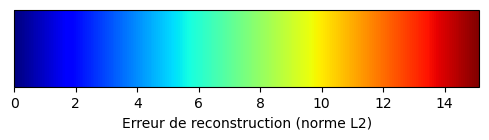

In [93]:
# Calcul des erreurs
errors = np.linalg.norm(worst_vertices_reconstructed - worst_vertices, axis=1)
errors_norm = (errors - errors.min()) / (errors.max() - errors.min())

# Colormap
cmap = plt.get_cmap("jet")
colors = (cmap(errors_norm)[:, :3] * 255).astype(np.uint8)

# Mesh coloré
mesh_error = trimesh.Trimesh(
    vertices=worst_vertices_reconstructed,
    faces=mesh_data.faces,
    vertex_colors=colors
)


fig, ax = plt.subplots(figsize=(6, 1))
norm = plt.Normalize(vmin=errors.min(), vmax=errors.max())
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cb = plt.colorbar(sm, cax=ax, orientation='horizontal')
cb.set_label('Erreur de reconstruction (norme L2)')
plt.show()

# --- Afficher le mesh ---
mesh_error.show()

In [94]:
#Sotckage résultats modèle

models_test_errors['Exact_Gaussian'] = pca_model.compute_error(X_test_reconstructed, X_test)
worst_reconstructed_meshes ['Exact_Gaussian'] = worst_reconstructed_mesh
ind_worst_reconstructed_meshes['Exact_Gaussian'] = worst_flat_index
colored_errors_worst_reconstructed_meshes['Exact_Gaussian'] = mesh_error

# III.2 Gaussian Inference with Missing Values on train

Early stopping at iteration  129
Restoring best SVD from iteration  29
Best iteration: 30


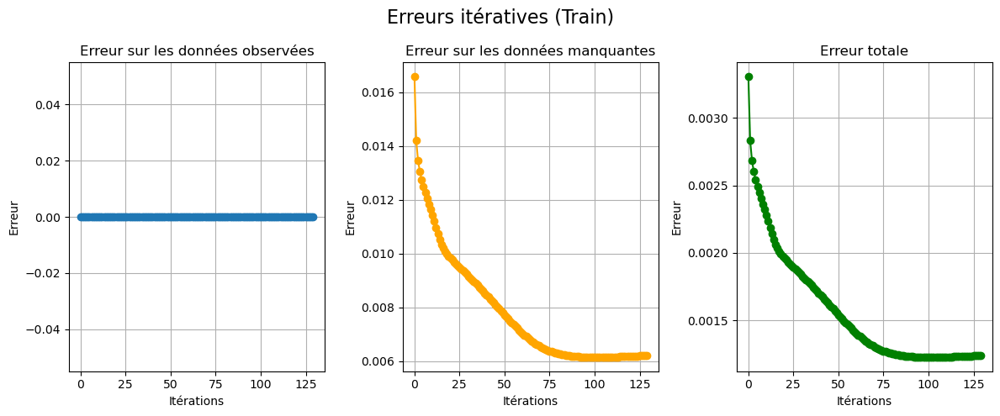

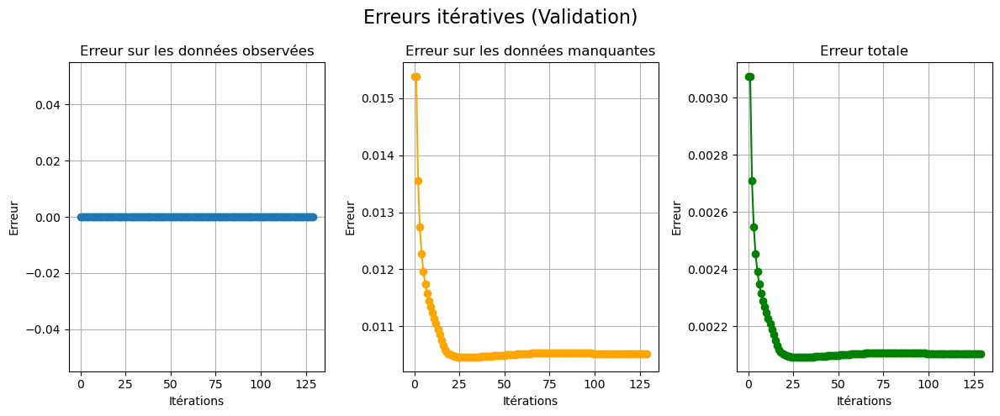

Reconstruction error on test set: 0.01441181544214487
Reconstruction error on test model 0: 0.041660990566015244
Reconstruction error on test model 1: 0.02307339571416378
Reconstruction error on test model 2: 0.030648017302155495
Reconstruction error on test model 3: 0.03326663374900818
Reconstruction error on test model 4: 0.029639847576618195
Average reconstruction error on test set: 0.03165777400135994
Standard deviation of reconstruction error on test set: 0.00602388521656394
Worst reconstructed model index: 0


In [95]:
gaussian_model = Gaussian_inference.Gaussian_Inference()
X_train_filled_flat, X_val_filled_flat, errors = gaussian_model.fit_train_val_masked(X_train_masked_flat, X_train_flat, X_val_masked_flat, X_val_flat, n_components=n_components, max_iteration=200, Early_Stopping=True, max_patience=100, verbose=False)

X_test_flat_reconstructed = gaussian_model.inference(X_test_masked_flat)
X_test_reconstructed = mesh_data.reconstruct_vertices_from_flat_vertices(X_test_flat_reconstructed)
error = gaussian_model.compute_error(X_test_reconstructed, X_test)

gaussian_model.plot_train_errors(errors)

print(f"Reconstruction error on test set: {error}")

errors = []
for i in range(len(X_test_reconstructed)):
    errors.append(gaussian_model.compute_error(X_test_reconstructed[i:i+1], X_test[i:i+1]))
    print(f"Reconstruction error on test model {i}: {errors[-1]}")

print(f"Average reconstruction error on test set: {np.mean(errors)}")
print(f"Standard deviation of reconstruction error on test set: {np.std(errors)}")

worst_flat_index = np.argmax(errors)
print(f"Worst reconstructed model index: {worst_flat_index}")


In [96]:
worst_vertices= X_test[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices)

if show_mesh:
    worst_reconstructed_mesh.show()

In [97]:
worst_vertices_reconstructed = X_test_reconstructed[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices_reconstructed)

if show_mesh:
    worst_reconstructed_mesh.show()

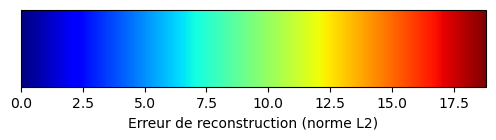

In [98]:
# Calcul des erreurs
errors = np.linalg.norm(worst_vertices_reconstructed - worst_vertices, axis=1)
errors_norm = (errors - errors.min()) / (errors.max() - errors.min())

# Colormap
cmap = plt.get_cmap("jet")
colors = (cmap(errors_norm)[:, :3] * 255).astype(np.uint8)

# Mesh coloré
mesh_error = trimesh.Trimesh(
    vertices=worst_vertices_reconstructed,
    faces=mesh_data.faces,
    vertex_colors=colors
)


fig, ax = plt.subplots(figsize=(6, 1))
norm = plt.Normalize(vmin=errors.min(), vmax=errors.max())
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cb = plt.colorbar(sm, cax=ax, orientation='horizontal')
cb.set_label('Erreur de reconstruction (norme L2)')
plt.show()

# --- Afficher le mesh ---
mesh_error.show()

In [99]:
#Sotckage résultats modèle

models_test_errors['Gaussian_missing_known'] = pca_model.compute_error(X_test_reconstructed, X_test)
worst_reconstructed_meshes ['Gaussian_missing_known'] = worst_reconstructed_mesh
ind_worst_reconstructed_meshes['Gaussian_missing_known'] = worst_flat_index
colored_errors_worst_reconstructed_meshes['Gaussian_missing_known'] = mesh_error

# III.3 Gaussian Inference with missing values on train (True values unkown)

In [100]:
gaussian_model = Gaussian_inference.Gaussian_Inference()
X_train_filled_flat = gaussian_model.fit_inference(X_train_masked_flat, n_components=n_components, max_iteration=500, tol=1e-4)

X_test_flat_reconstructed = gaussian_model.inference(X_test_masked_flat)
X_test_reconstructed = mesh_data.reconstruct_vertices_from_flat_vertices(X_test_flat_reconstructed)
error = gaussian_model.compute_error(X_test_reconstructed, X_test)

print(f"Reconstruction error on test set: {error}")

errors = []
for i in range(len(X_test_reconstructed)):
    errors.append(gaussian_model.compute_error(X_test_reconstructed[i:i+1], X_test[i:i+1]))
    print(f"Reconstruction error on test model {i}: {errors[-1]}")

print(f"Average reconstruction error on test set: {np.mean(errors)}")
print(f"Standard deviation of reconstruction error on test set: {np.std(errors)}")

worst_flat_index = np.argmax(errors)
print(f"Worst reconstructed model index: {worst_flat_index}")


Converged at iteration  18
Reconstruction error on test set: 0.013950491324067116
Reconstruction error on test model 0: 0.040181390941143036
Reconstruction error on test model 1: 0.024733848869800568
Reconstruction error on test model 2: 0.02958865277469158
Reconstruction error on test model 3: 0.030453013256192207
Reconstruction error on test model 4: 0.028917530551552773
Average reconstruction error on test set: 0.030774887651205063
Standard deviation of reconstruction error on test set: 0.005097783636301756
Worst reconstructed model index: 0


In [101]:
worst_vertices= X_test[worst_flat_index]
worst_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices)

if show_mesh:
    worst_mesh.show()

In [102]:
worst_vertices_reconstructed = X_test_reconstructed[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices_reconstructed)

if show_mesh:
    worst_reconstructed_mesh.show()

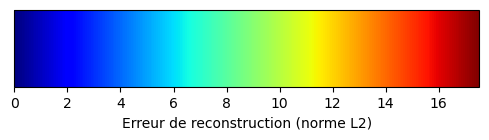

In [103]:
# Calcul des erreurs
errors = np.linalg.norm(worst_vertices_reconstructed - worst_vertices, axis=1)
errors_norm = (errors - errors.min()) / (errors.max() - errors.min())

# Colormap
cmap = plt.get_cmap("jet")
colors = (cmap(errors_norm)[:, :3] * 255).astype(np.uint8)

# Mesh coloré
mesh_error = trimesh.Trimesh(
    vertices=worst_vertices_reconstructed,
    faces=mesh_data.faces,
    vertex_colors=colors
)


fig, ax = plt.subplots(figsize=(6, 1))
norm = plt.Normalize(vmin=errors.min(), vmax=errors.max())
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cb = plt.colorbar(sm, cax=ax, orientation='horizontal')
cb.set_label('Erreur de reconstruction (norme L2)')
plt.show()

# --- Afficher le mesh ---
mesh_error.show()

In [104]:
#Sotckage résultats modèle

models_test_errors['Gaussian_missing_unknown'] = pca_model.compute_error(X_test_reconstructed, X_test)
worst_reconstructed_meshes ['Gaussian_missing_unknown'] = worst_reconstructed_mesh
ind_worst_reconstructed_meshes['Gaussian_missing_unknown'] = worst_flat_index
colored_errors_worst_reconstructed_meshes['Gaussian_missing_unknown'] = mesh_error

# IV PPCA

Best iteration: 168


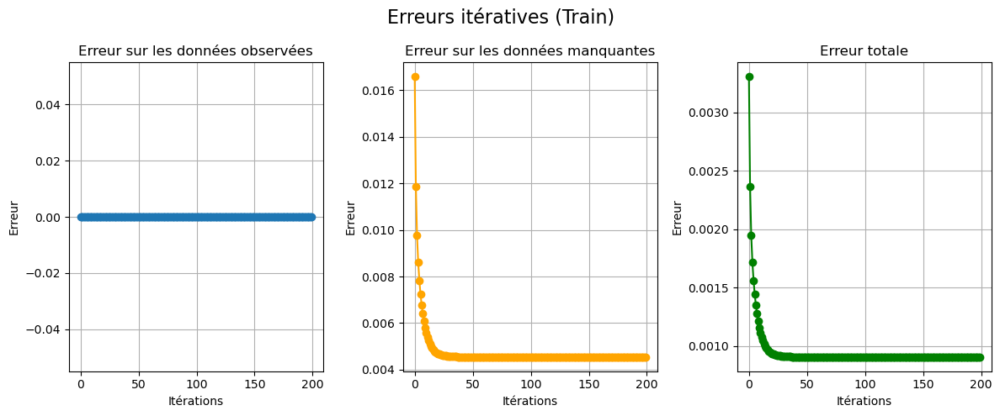

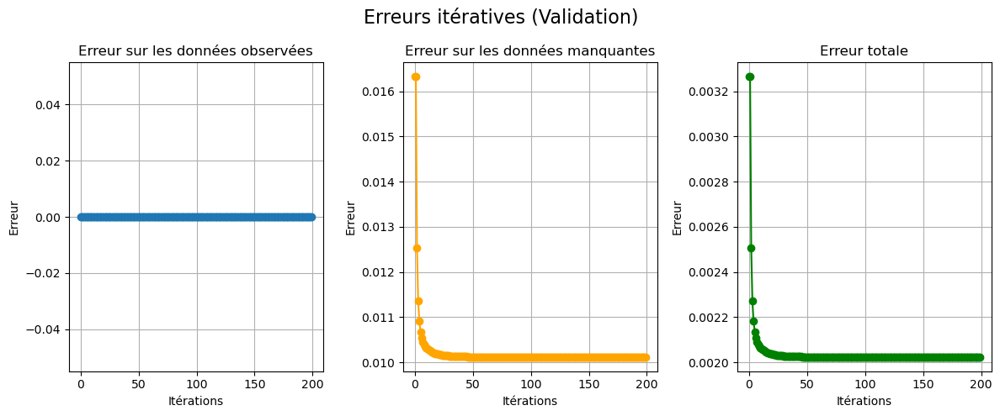

Reconstruction error on test set: 0.01353626511991024
Reconstruction error on test model 0: 0.0350528247654438
Reconstruction error on test model 1: 0.02663556858897209
Reconstruction error on test model 2: 0.028347762301564217
Reconstruction error on test model 3: 0.024934977293014526
Reconstruction error on test model 4: 0.03488923981785774
Average reconstruction error on test set: 0.029972072690725327
Standard deviation of reconstruction error on test set: 0.004222216084599495
Worst reconstructed model index: 0


In [105]:
ppca_model = PPCA_Model.PPCA_model()
X_train_filled_flat, X_val_filled_flat, errors = ppca_model.fit_train_val_masked(X_train_masked_flat, X_train_flat, X_val_masked_flat, X_val_flat, n_components=n_components, max_iteration=200, Early_Stopping=True, max_patience=100, verbose=False)

X_test_flat_reconstructed = ppca_model.inference(X_test_masked_flat)
X_test_reconstructed = mesh_data.reconstruct_vertices_from_flat_vertices(X_test_flat_reconstructed)
error = ppca_model.compute_error(X_test_reconstructed, X_test)

ppca_model.plot_train_errors(errors)

print(f"Reconstruction error on test set: {error}")

errors = []
for i in range(len(X_test_reconstructed)):
    errors.append(gaussian_model.compute_error(X_test_reconstructed[i:i+1], X_test[i:i+1]))
    print(f"Reconstruction error on test model {i}: {errors[-1]}")

print(f"Average reconstruction error on test set: {np.mean(errors)}")
print(f"Standard deviation of reconstruction error on test set: {np.std(errors)}")

worst_flat_index = np.argmax(errors)
print(f"Worst reconstructed model index: {worst_flat_index}")



In [106]:
worst_vertices= X_test[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices)

if show_mesh:
    worst_reconstructed_mesh.show()

In [107]:
worst_vertices_reconstructed = X_test_reconstructed[worst_flat_index]
worst_reconstructed_mesh = mesh_data.reconstruct_mesh_from_vertices(worst_vertices_reconstructed)

if show_mesh:
    worst_reconstructed_mesh.show()

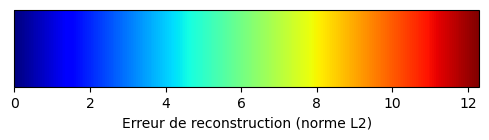

In [108]:
# Calcul des erreurs
errors = np.linalg.norm(worst_vertices_reconstructed - worst_vertices, axis=1)
errors_norm = (errors - errors.min()) / (errors.max() - errors.min())

# Colormap
cmap = plt.get_cmap("jet")
colors = (cmap(errors_norm)[:, :3] * 255).astype(np.uint8)

# Mesh coloré
mesh_error = trimesh.Trimesh(
    vertices=worst_vertices_reconstructed,
    faces=mesh_data.faces,
    vertex_colors=colors
)


fig, ax = plt.subplots(figsize=(6, 1))
norm = plt.Normalize(vmin=errors.min(), vmax=errors.max())
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cb = plt.colorbar(sm, cax=ax, orientation='horizontal')
cb.set_label('Erreur de reconstruction (norme L2)')
plt.show()

# --- Afficher le mesh ---
mesh_error.show()

In [109]:
#Sotckage résultats modèle

models_test_errors['PPCA'] = pca_model.compute_error(X_test_reconstructed, X_test)
worst_reconstructed_meshes ['PPCA'] = worst_reconstructed_mesh
ind_worst_reconstructed_meshes['PPCA'] = worst_flat_index
colored_errors_worst_reconstructed_meshes['PPCA'] = mesh_error

In [110]:
#Synthèse des résultats
print("Modèle\t\t\tErreur de reconstruction sur le test set")
for model_name, error in models_test_errors.items():
    print(f"{model_name}\t\t{error}")

Modèle			Erreur de reconstruction sur le test set
Exact PCA		0.011652189306914806
PCA_1_aug		0.011652190116978794
PCA_Missing		0.027945883572101593
Exact_Gaussian		0.017720848321914673
Gaussian_missing_known		0.01441181544214487
Gaussian_missing_unknown		0.013950491324067116
PPCA		0.01353626511991024


In [111]:
#Affichage des meshes colorés des erreurs
for model_name, mesh in colored_errors_worst_reconstructed_meshes.items():
    print(f"Modèle: {model_name}")
    mesh.show()

Modèle: Exact PCA
Modèle: PCA_1_aug
Modèle: PCA_Missing
Modèle: Exact_Gaussian
Modèle: Gaussian_missing_known
Modèle: Gaussian_missing_unknown
Modèle: PPCA


# IV GPLVM

# V GCN